<a href="https://colab.research.google.com/github/Krishnan-Raghavan/Packt/blob/main/StableDiffusionChapter11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
!pip install diffusers

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


  0%|          | 0/50 [00:00<?, ?it/s]

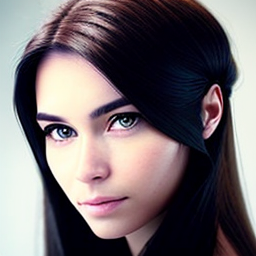

In [7]:
import torch
from diffusers import StableDiffusionPipeline

text2img_pipe = StableDiffusionPipeline.from_pretrained(
    "stablediffusionapi/deliberate-v2"
    , torch_dtype = torch.float16
).to("cuda:0")

prompt = "a realistic photo of beautiful woman face"
neg_prompt = "NSFW, bad anatomy"

raw_image = text2img_pipe(
    prompt = prompt
    , negative_prompt = neg_prompt
    , height = 256
    , width = 256
    , generator = torch.Generator("cuda").manual_seed(3)
).images[0]
display(raw_image)

In [8]:
image_name = "woman_face"
file_name_256x256 = f"/content/{image_name}_256x256.png"
raw_image.save(file_name_256x256)

In [9]:
def get_width_height(width, height):
    width = (width//8)*8
    height = (height//8)*8
    return width,height

In [10]:
from diffusers.utils import load_image
from PIL import Image

def resize_img(img_path,upscale_times):
    img             = load_image(img_path)
    if upscale_times <=0:
        return img
    width,height    = img.size
    width           = width * upscale_times
    height          = height * upscale_times
    width,height    = get_width_height(int(width),int(height))
    img             = img.resize(
        (width,height)
        ,resample = Image.LANCZOS if upscale_times > 1 else Image.AREA
    )
    return img

In [11]:
resized_raw_image = resize_img(file_name_256x256, 3.0)

In [35]:
sr_prompt = """8k, best quality, masterpiece, realistic, photo-realistic, ultra detailed, sharp focus, raw photo, """
prompt = """
a realistic photo of beautiful woman face
"""
prompt = f"{sr_prompt}{prompt}"
neg_prompt = "worst quality, low quality, lowres, bad anatomy"

In [36]:
prompt = f"{sr_prompt}{prompt}"

neg_prompt = "worst quality, low quality, lowres, bad anatomy"

img2image_3x = img2img_pipe(
    image = resized_raw_image
    , prompt = prompt
    , negative_prompt = neg_prompt
    , strength = 0.3
    , num_inference_steps = 80
    , guidance_scale = 8
    , generator = torch.Generator("cuda").manual_seed(1)
).images[0]
img2image_3x

NameError: name 'img2img_pipe' is not defined

In [37]:
file_name_768x768 = f"/content/{image_name}_768x768.png"
img2image_3x.save(file_name_768x768)

NameError: name 'img2image_3x' is not defined

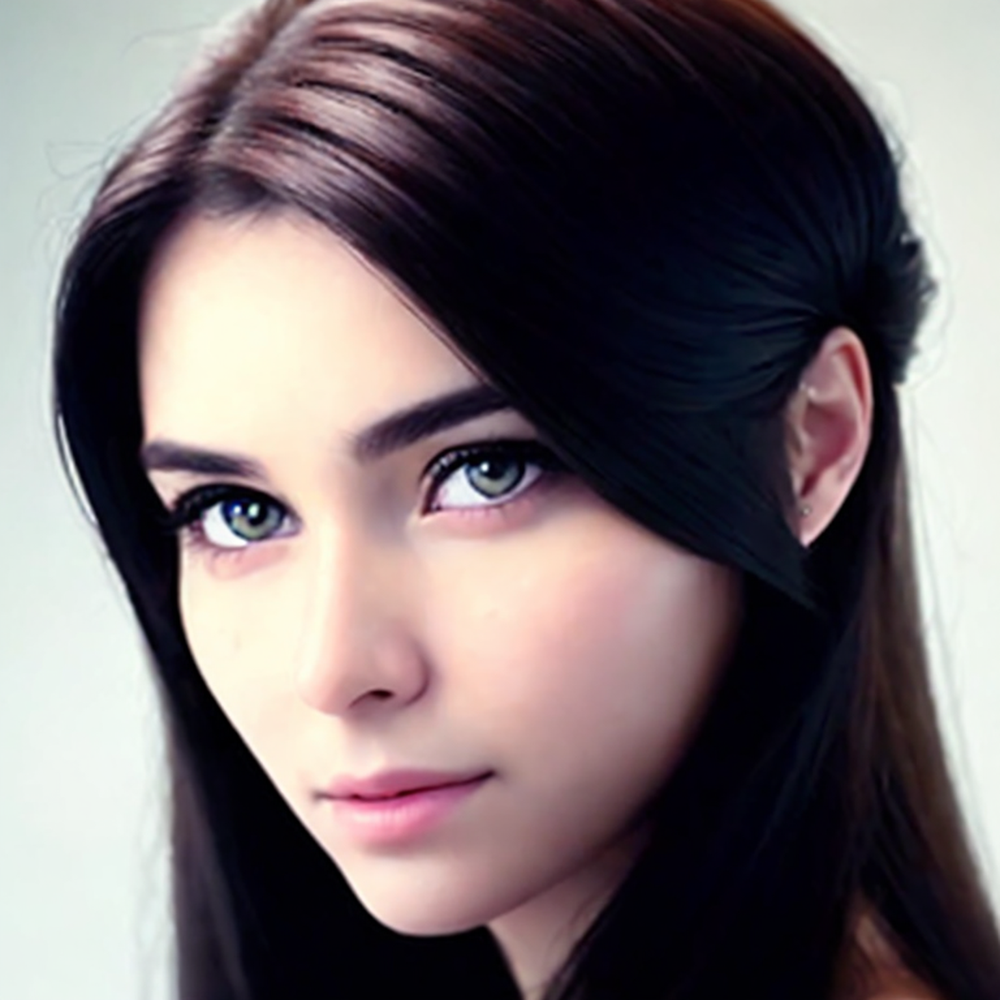

In [38]:
resized_raw_image = resize_img(file_name_768x768, 2.0)
display(resized_raw_image)

In [41]:
sr_prompt = "8k, best quality, masterpiece, realistic, photo-realistic, ultra detailed, sharp focus, raw photo,"

prompt = """
a realistic photo of beautiful woman face
"""
prompt = f"{sr_prompt}{prompt}"

neg_prompt = "worst quality, low quality, lowres, bad anatomy"

img2image_6x = img2img_pipe(
    image = resized_raw_image
    , prompt = prompt
    , negative_prompt = neg_prompt
    , strength = 0.3
    , num_inference_steps = 80
    , guidance_scale = 7.5
    , generator = torch.Generator("cuda").manual_seed(1)
).images[0]
img2image_6x

NameError: name 'img2img_pipe' is not defined

In [42]:
import torch
from diffusers import ControlNetModel

controlnet = ControlNetModel.from_pretrained(
    'takuma104/control_v11'
    , subfolder = 'control_v11f1e_sd15_tile'
    , torch_dtype = torch.float16
)

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


control_v11f1e_sd15_tile/config.json:   0%|          | 0.00/955 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/723M [00:00<?, ?B/s]

In [43]:
# load controlnet tile
from diffusers import StableDiffusionControlNetImg2ImgPipeline

# load checkpoint model with controlnet
pipeline = StableDiffusionControlNetImg2ImgPipeline.from_pretrained(
    "stablediffusionapi/deliberate-v2"
    , torch_dtype    = torch.float16
    , controlnet     = controlnet
)

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


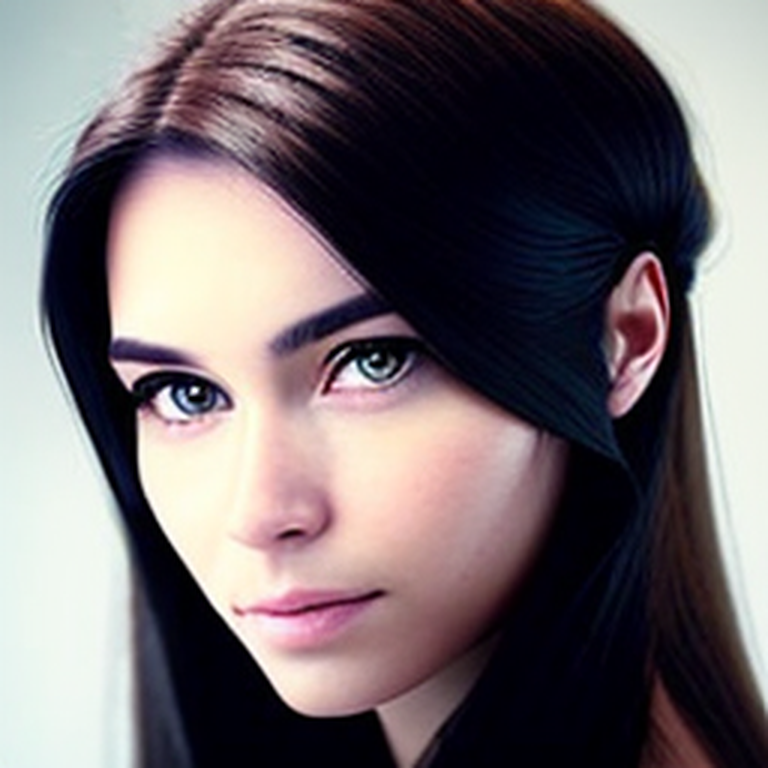

In [44]:
image_name = "woman_face"
file_name_256x256 = f"/content/{image_name}_256x256.png"
resized_raw_image = resize_img(file_name_256x256, 3.0)
resized_raw_image

  0%|          | 0/40 [00:00<?, ?it/s]

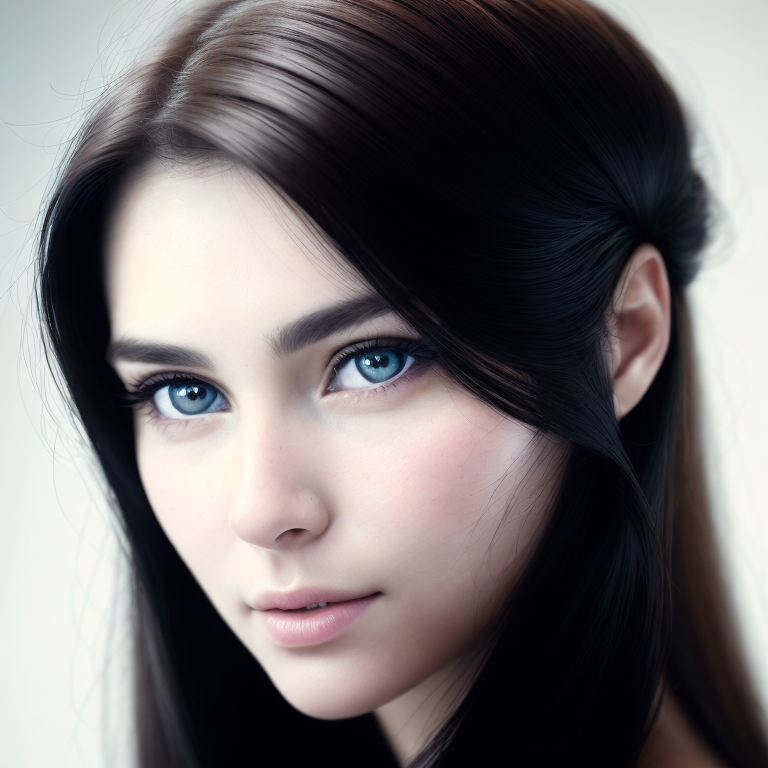

In [45]:
sr_prompt = "8k, best quality, masterpiece, realistic, photo-realistic, ultra detailed, sharp focus, raw photo,"

prompt = """
a realistic photo of beautiful woman face
"""

prompt = f"{sr_prompt}{prompt}"

neg_prompt = "worst quality, low quality, lowres, bad anatomy"

pipeline.to("cuda")
cn_tile_upscale_img = pipeline(
    image                           = resized_raw_image
    , control_image                 = resized_raw_image
    , prompt                        = prompt
    , negative_prompt               = neg_prompt
    , strength                      = 0.8
    , guidance_scale                = 7
    , generator                     = torch.Generator("cuda")
    , num_inference_steps           = 50
).images[0]

cn_tile_upscale_img

  0%|          | 0/50 [00:00<?, ?it/s]

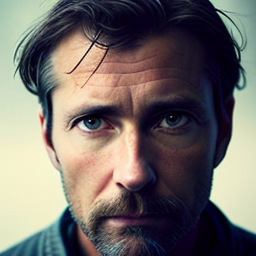

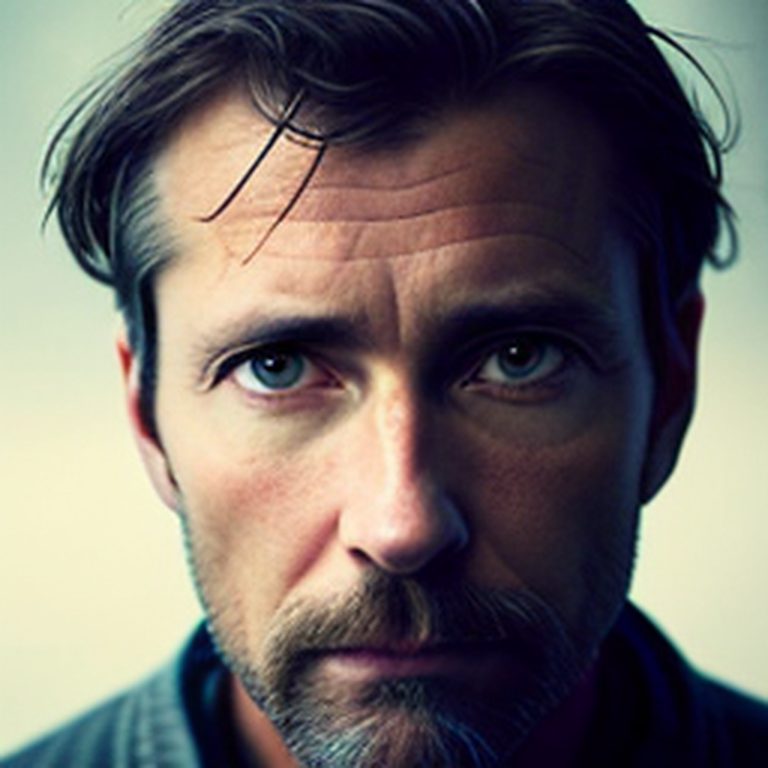

In [47]:
# step 1. generate an image
prompt = """
Raw, analog a portrait of an 43 y.o. man ,
beautiful photo with highly detailed face by greg rutkowski and magali villanueve
"""

neg_prompt = "NSFW, bad anatomy"

text2img_pipe.to("cuda")
raw_image = text2img_pipe(
    prompt = prompt
    , negative_prompt = neg_prompt
    , height = 256
    , width = 256
    , generator = torch.Generator("cuda").manual_seed(3)
).images[0]
display(raw_image)

image_name = "man"
file_name_256x256 = f"/content/{image_name}_256x256.png"
raw_image.save(file_name_256x256)

# step 2. resize image
resized_raw_image = resize_img(file_name_256x256, 3.0)
display(resized_raw_image)

  0%|          | 0/40 [00:00<?, ?it/s]

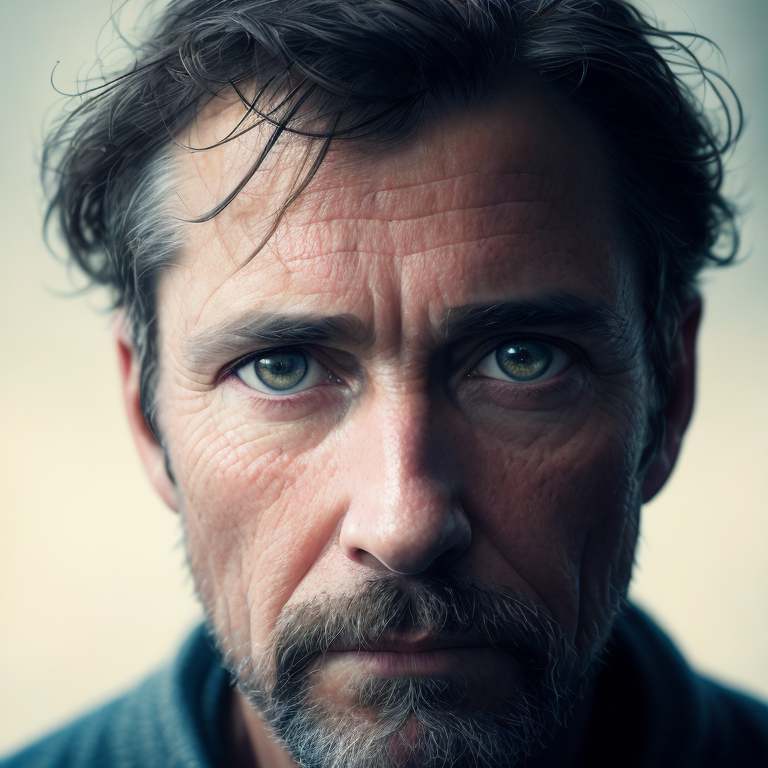

In [48]:
sr_prompt = "8k, best quality, masterpiece, realistic, photo-realistic, ultra detailed, sharp focus, raw photo,"

prompt = f"{sr_prompt}{prompt}"

neg_prompt = "worst quality, low quality, lowres, bad anatomy"

pipeline.to("cuda")
cn_tile_upscale_img = pipeline(
    image                           = resized_raw_image
    , control_image                 = resized_raw_image
    , prompt                        = prompt
    , negative_prompt               = neg_prompt
    , strength                      = 0.8
    , guidance_scale                = 7
    , generator                     = torch.Generator("cuda")
    , num_inference_steps           = 50
    #, controlnet_conditioning_scale = 0.8
).images[0]

display(cn_tile_upscale_img)

  0%|          | 0/50 [00:00<?, ?it/s]

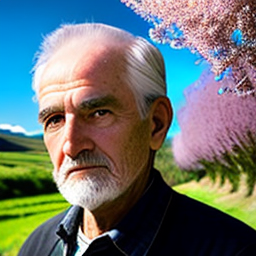

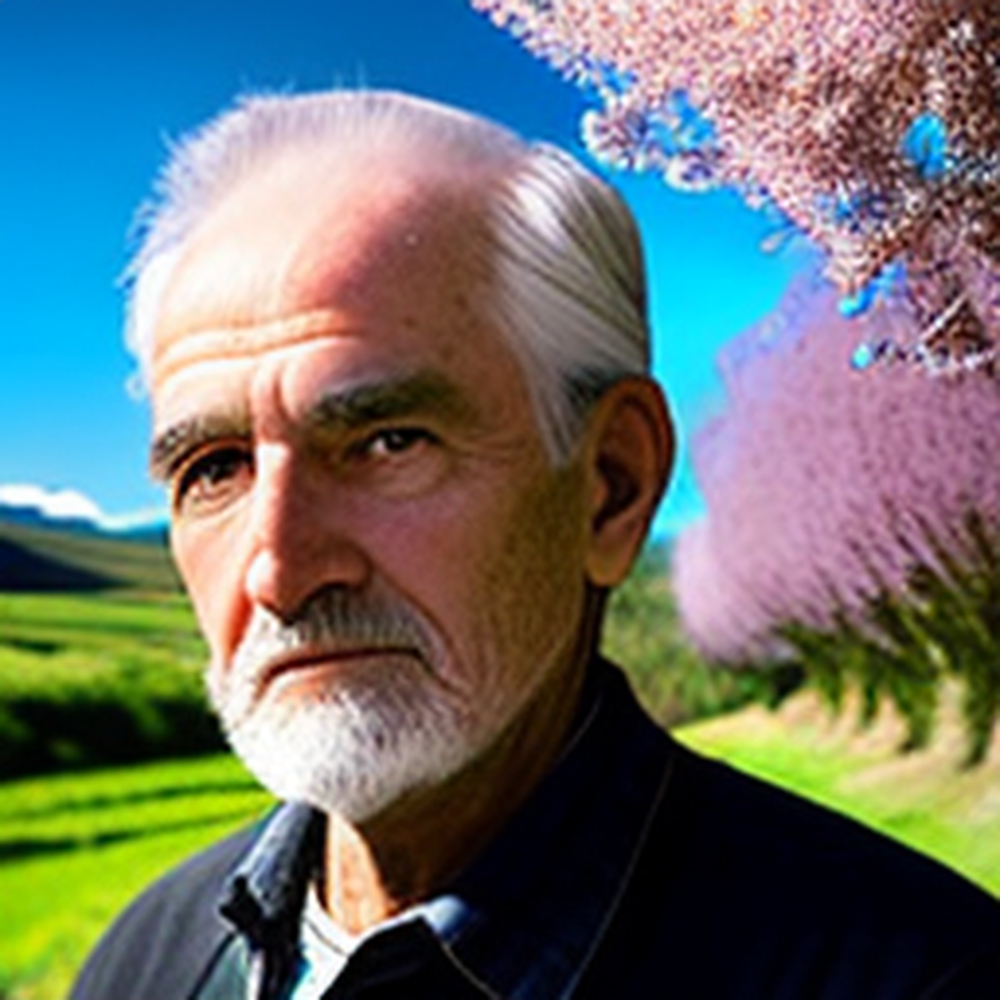

  0%|          | 0/40 [00:00<?, ?it/s]

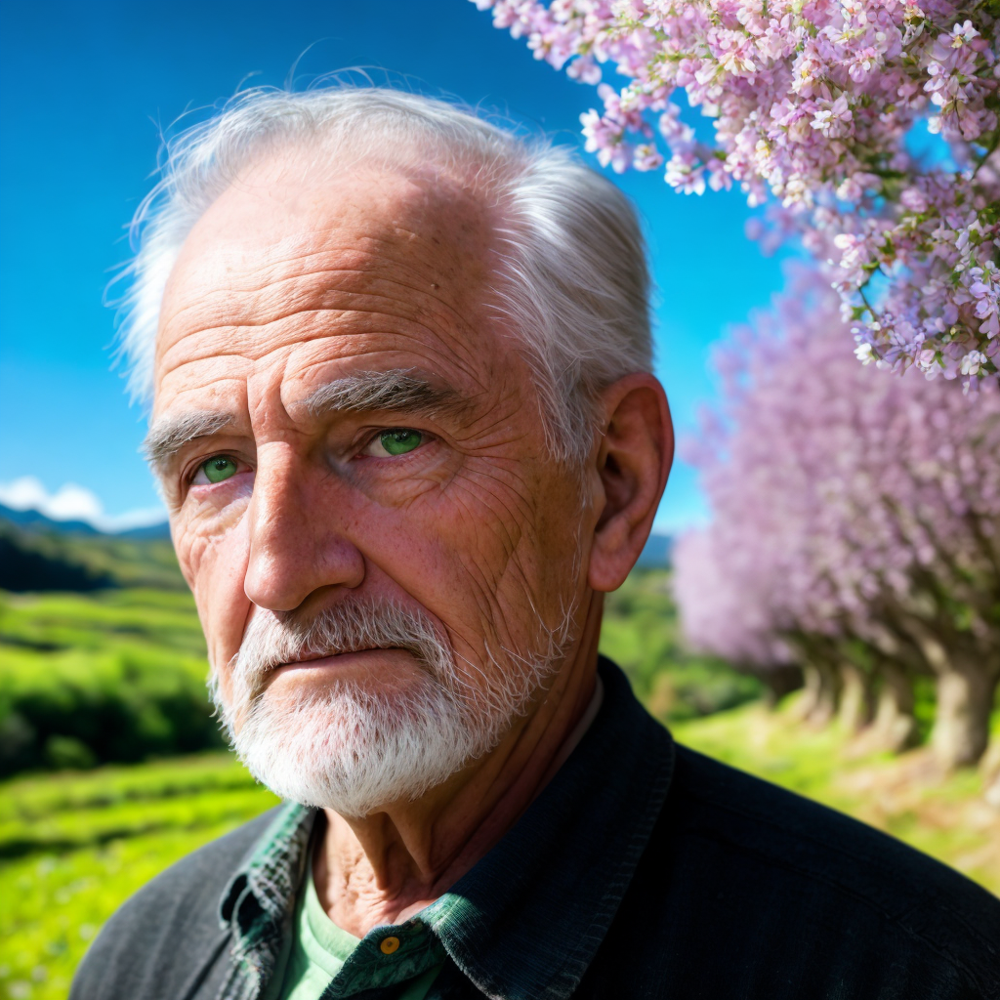

In [51]:
# step 1. generate an image
prompt = """
A realistic photo of an old man, standing in the gardon, flower and green trees around, face view
"""

neg_prompt = "NSFW, bad anatomy"

text2img_pipe.to("cuda")
raw_image = text2img_pipe(
    prompt = prompt
    , negative_prompt = neg_prompt
    , height = 256
    , width = 256
    , generator = torch.Generator("cuda").manual_seed(3)
).images[0]
display(raw_image)

image_name = "man"
file_name_256x256 = f"/content/{image_name}_256x256.png"
raw_image.save(file_name_256x256)

# step 2. resize image
resized_raw_image = resize_img(file_name_256x256, 4.0)
display(resized_raw_image)

# step 3. upscale image
sr_prompt = "8k, best quality, masterpiece, realistic, photo-realistic, ultra detailed, sharp focus, raw photo,"

prompt = f"{sr_prompt}{prompt}"

neg_prompt = "worst quality, low quality, lowres, bad anatomy"

pipeline.to("cuda")
cn_tile_upscale_img = pipeline(
    image                           = resized_raw_image
    , control_image                 = resized_raw_image
    , prompt                        = prompt
    , negative_prompt               = neg_prompt
    , strength                      = 0.8
    , guidance_scale                = 7
    , generator                     = torch.Generator("cuda")
    , num_inference_steps           = 50
    #, controlnet_conditioning_scale = 0.8
).images[0]

display(cn_tile_upscale_img)

  0%|          | 0/50 [00:00<?, ?it/s]

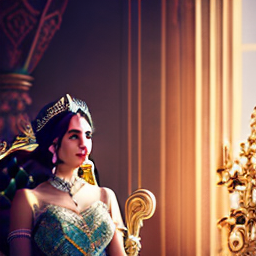

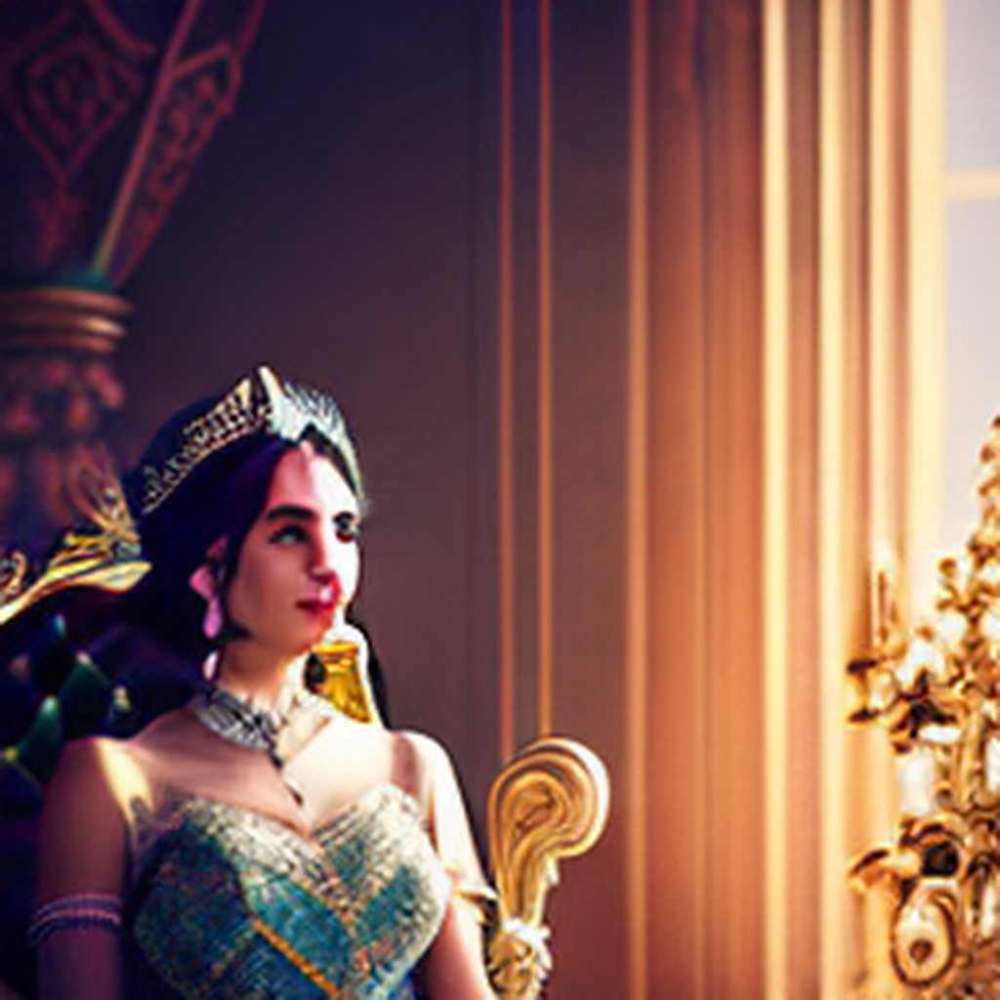

  0%|          | 0/40 [00:00<?, ?it/s]

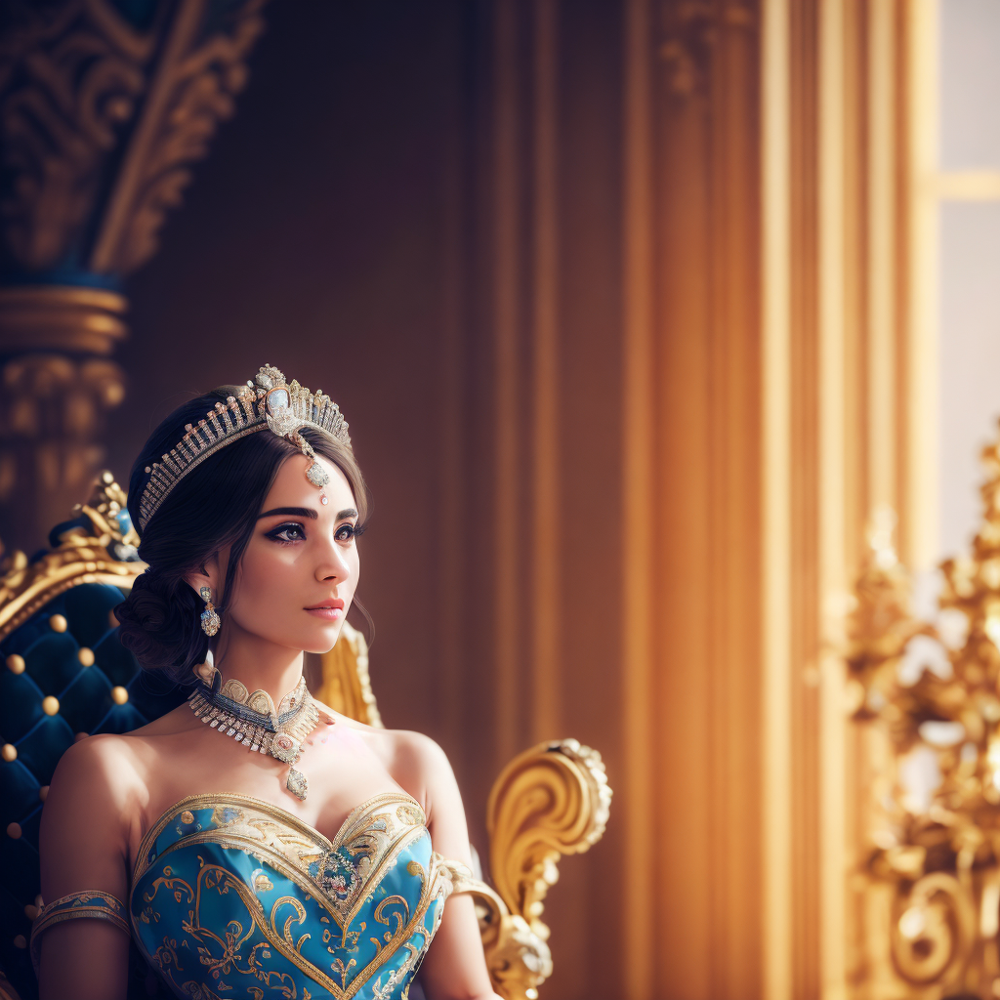

In [53]:
# step 1. generate an image
prompt = """
upper body photo of royal female, elegant, pretty face, majestic dress,
sitting on a majestic chair, in a grand fantasy castle hall, shallow depth of field, cinematic lighting, Nikon D850,
film still, HDR, 8k
"""

neg_prompt = "NSFW, bad anatomy"

text2img_pipe.to("cuda")
raw_image = text2img_pipe(
    prompt = prompt
    , negative_prompt = neg_prompt
    , height = 256
    , width = 256
    , generator = torch.Generator("cuda").manual_seed(7)
).images[0]
display(raw_image)

image_name = "man"
file_name_256x256 = f"/content/{image_name}_256x256.png"
raw_image.save(file_name_256x256)

# step 2. resize image
resized_raw_image = resize_img(file_name_256x256, 4.0)
display(resized_raw_image)

# step 3. upscale image
sr_prompt = "8k, best quality, masterpiece, realistic, photo-realistic, ultra detailed, sharp focus, raw photo,"

prompt = f"{sr_prompt}{prompt}"

neg_prompt = "worst quality, low quality, lowres, bad anatomy"

pipeline.to("cuda")
cn_tile_upscale_img = pipeline(
    image                           = resized_raw_image
    , control_image                 = resized_raw_image
    , prompt                        = prompt
    , negative_prompt               = neg_prompt
    , strength                      = 0.8
    , guidance_scale                = 7
    , generator                     = torch.Generator("cuda")
    , num_inference_steps           = 50
    #, controlnet_conditioning_scale = 0.8
).images[0]

display(cn_tile_upscale_img)